#### 1) Q700 anomaly maps for each WT 
#### 2) Q700 Seasonal anomaly of ECMWF
- 2.1) seasonal climatology
- 2.2) seasonal anomaly

Ming Ge Oct 2024

In [1]:
import sys
import datetime
import numpy as np
import pandas as pd
from pandas.tseries.offsets import MonthEnd
import xarray as xr
import matplotlib.pyplot as plt
import glob 
import os.path
import cartopy 
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# inorder to import my pathon module, add
# $PYTHONPATH for jupyter for module
sys.path.append("/glade/u/home/mingge/PYTHON")
import coexist_func 
from importlib import reload
reload(coexist_func)

from coexist_func import plot_prec_12
from coexist_func import plot_prec_12_erai 
from coexist_func import cal_prec_ano_ecmwf
from coexist_func import cal_prec_cli_ecmwf
from coexist_func import cal_season_cli_ecmwf_nc
from coexist_func import cal_season_ano_ecmwf_nc

#### Read domain info

In [2]:
# centroid_ana.ibynb, wt_hist_smyle_era5.ipynb
# to read domain info
sCentroids = '/glade/u/home/mingge/WTing_existing-centroids/CONUS-WTs_existing_centroids.npz'
DATA = np.load(sCentroids)
rgrCentroids = DATA['rgrCentroids']               # (12, 3, 24, 74)
rgiWTs = range(1, rgrCentroids.shape[0]+1, 1)     # number of WT 

lat_s = DATA['rgrLatWT'].min() - 6
lat_e = DATA['rgrLatWT'].max() + 2
lon_s = DATA['rgrLonWT'].min() 
lon_e = DATA['rgrLonWT'].max() + 6
print('lat:', lat_s , '-', lat_e, 'lon:', lon_s, '-', lon_e)

season_dict = {
    'DJF': [12,1,2],
    'MAM': [3,4,5],
    'JJA': [6,7,8],
    'SON': [9,10,11],
    'JAS': [7,8,9]}

n_season = len(season_dict)
n_season = 4

year_s = 1993
year_e = 2021
n_year = year_e - year_s + 1

n_fcst = 215

n_wt = 12

lat: 24.75 - 50.0 lon: -125.25 - -64.5


In [3]:
dir_ecmwf = '/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/'
dir_wt    = '/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/'
var_s = 'q700'

#### calculate Q700 climatology

In [4]:
# get dimension size info
flnm = dir_ecmwf + var_s.upper() + '/' + var_s.lower() + '_day_ECMWF_mem07_200508.nc'
print(flnm)
with xr.open_dataset(flnm) as ds:
    lat    = ds.g0_lat_3
    lon    = ds.g0_lon_4
    nl_lat = len(lat)
    nl_lon = len(lon)
    print(nl_lat, nl_lon)

/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/Q700/q700_day_ECMWF_mem07_200508.nc
41 76


 - lead month 1 climatology

In [5]:
%%time
is_leadMonth1 = True
flnm_o = dir_wt + var_s.lower() + '_clim_leadMonth1_eachMem.nc'
print(flnm_o)
prec_clim_xr = cal_prec_cli_ecmwf(dir_wt, nl_lat, nl_lon, year_s, year_s, is_leadMonth1, flnm_o, 'q700')


/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_clim_leadMonth1_eachMem.nc
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_clim_leadMonth1_eachMem.nc exist
precipitation mean of 51 members
CPU times: user 6.78 ms, sys: 322 µs, total: 7.1 ms
Wall time: 30 ms


 - 215 fcst day climatology

In [6]:
is_leadMonth1 = False
flnm_o = dir_wt + var_s.lower() + '_clim_215day_eachMem.nc'
print(flnm_o)
prec_clim_xr = cal_prec_cli_ecmwf(dir_wt, nl_lat, nl_lon, year_s, year_e, is_leadMonth1, flnm_o, 'q700')

/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_clim_215day_eachMem.nc
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_clim_215day_eachMem.nc exist
precipitation mean of 51 members


#### SLP of WTs
 -  use ensemble mean climatology

In [7]:
flnm_cli = dir_wt + var_s.lower() + '_clim_215day_eachMem.nc'
print(flnm_cli)
is_mean = True
cal_prec_ano_ecmwf(dir_wt,  year_s, year_e, lat_s, lat_e, lon_s, lon_e, is_mean, flnm_cli, var_s, False)

/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_clim_215day_eachMem.nc
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_01.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_02.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_03.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_04.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_05.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_06.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_07.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_08.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_09.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_10.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_11.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_12.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_13.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_wt_14.nc exist
/g

In [8]:
n_mem = 25
print(flnm_cli)
with  xr.open_dataset(flnm_cli) as ds_prec:
    prec = ds_prec.__xarray_dataarray_variable__[:n_mem]

if var_s == 'prec':
    prec_cli = prec.sel(lat=slice(lat_e, lat_s),lon=slice(lon_s, lon_e))
elif var_s =='mslp':
    prec_cli = prec.sel(g0_lat_2 = slice(lat_e, lat_s), g0_lon_3=slice(lon_s, lon_e))
elif var_s == 'q700':
    prec_cli = prec.sel(g0_lat_3 = slice(lat_e, lat_s), g0_lon_4=slice(lon_s, lon_e))
prec_mean = prec_cli.mean(dim='member')

/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_clim_215day_eachMem.nc


#### ensemble average precipitation anomaly maps for each WT

https://www.frontiersin.org/articles/10.3389/fenvs.2019.00036/full

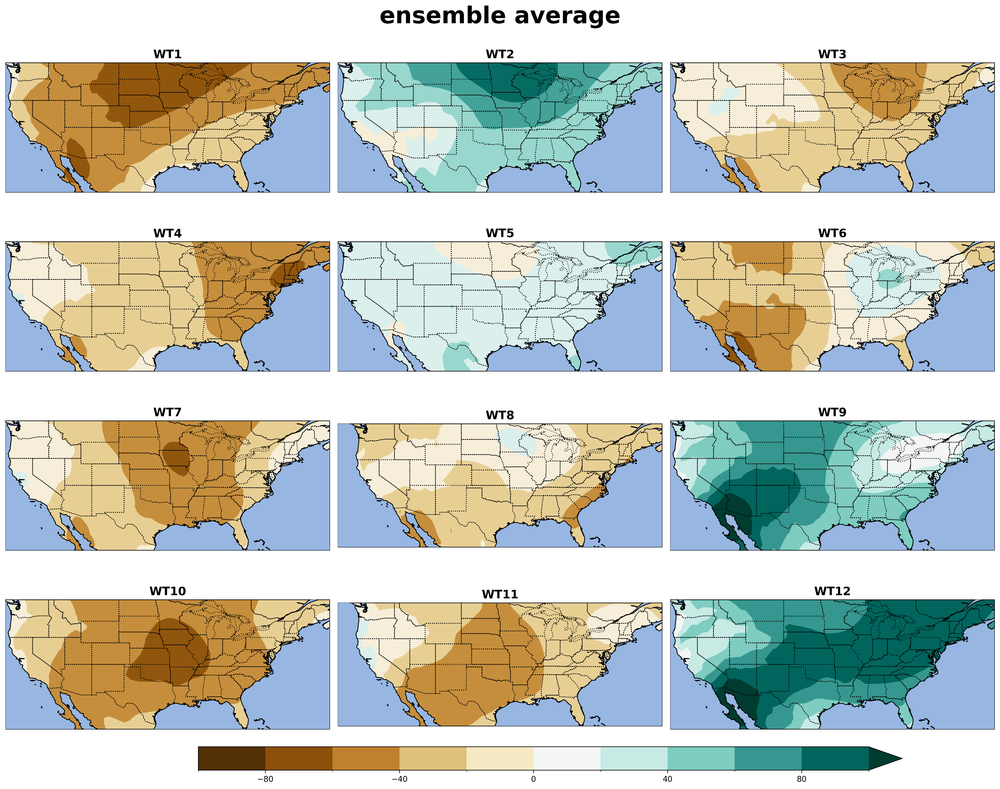

In [9]:
n_mem = 25
n_wt = 12
for mem in range(1, n_mem+1,1):
    mem_s = str(mem).zfill(2)
    flnm_wt = dir_wt + var_s.lower()+ '_wt_' + mem_s + '.nc'
    #print(flnm_wt)
    
    with  xr.open_dataset(flnm_wt) as ds_prec:
        prec_wt = ds_prec.__xarray_dataarray_variable__

        if mem == 1:
            prec_avg = prec_wt.copy()
        else:
            prec_avg = prec_avg + prec_wt
            
prec_avg = (prec_avg/25.0 - prec_mean)/prec_mean*100
plot_prec_12_erai(prec_avg, -100, 100, 11, 'BrBG', 'horizontal', 'ensemble average')

2) MSLP Seasonal anomaly of ECMWF

2.1) seasonal climatology

In [10]:
flnm_cli = dir_wt + var_s + '_seasonal_cli.nc'
prec_cli_xr = cal_season_cli_ecmwf_nc('mslp', dir_wt, season_dict, year_s, year_e, lat, lon, flnm_cli)

/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_seasonal_cli.nc exist


- 2.2) seasonal anomaly

In [11]:
flnm_cli = dir_wt + var_s + '_seasonal_cli.nc'
flnm_o = dir_wt + var_s + '_seasonal_ano.nc'
cal_season_ano_ecmwf_nc('mslp', dir_wt, dir_wt + 'WT_01/', season_dict, year_s, year_e, lat, lon, flnm_cli)

/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/q700_seasonal_cli.nc
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem01.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem02.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem03.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem04.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem05.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem06.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem07.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem08.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem09.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem10.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/ECMWF/MSLP/mslp_seasonal_ano_mem11.nc exist
/glade/ca

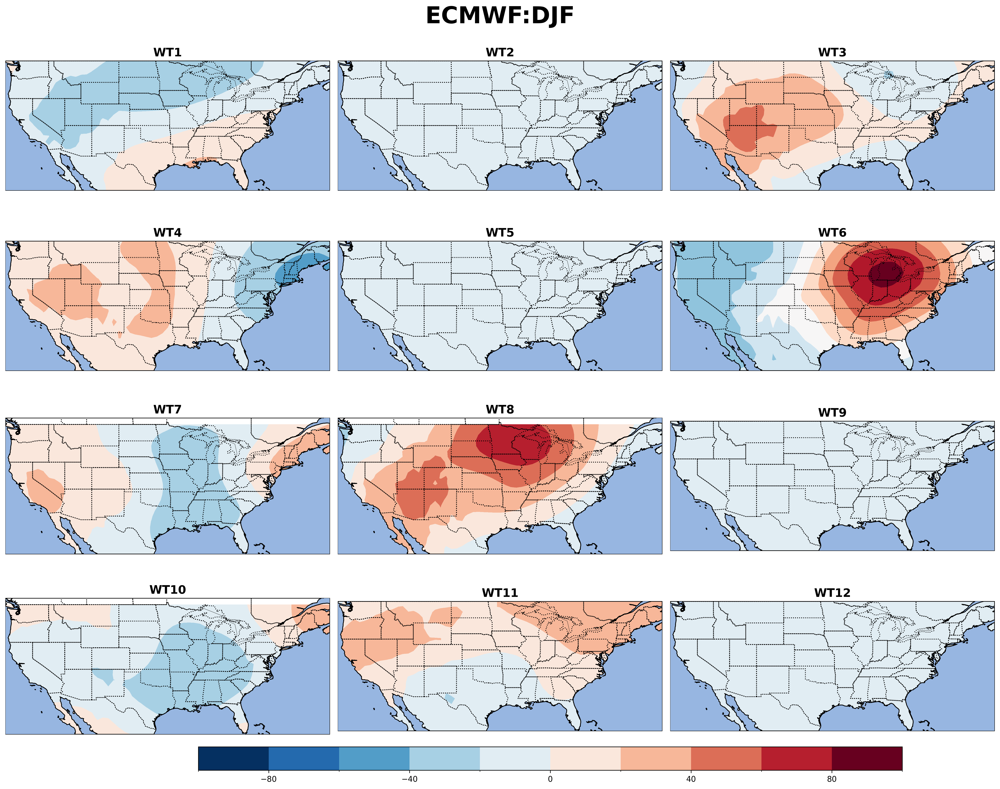

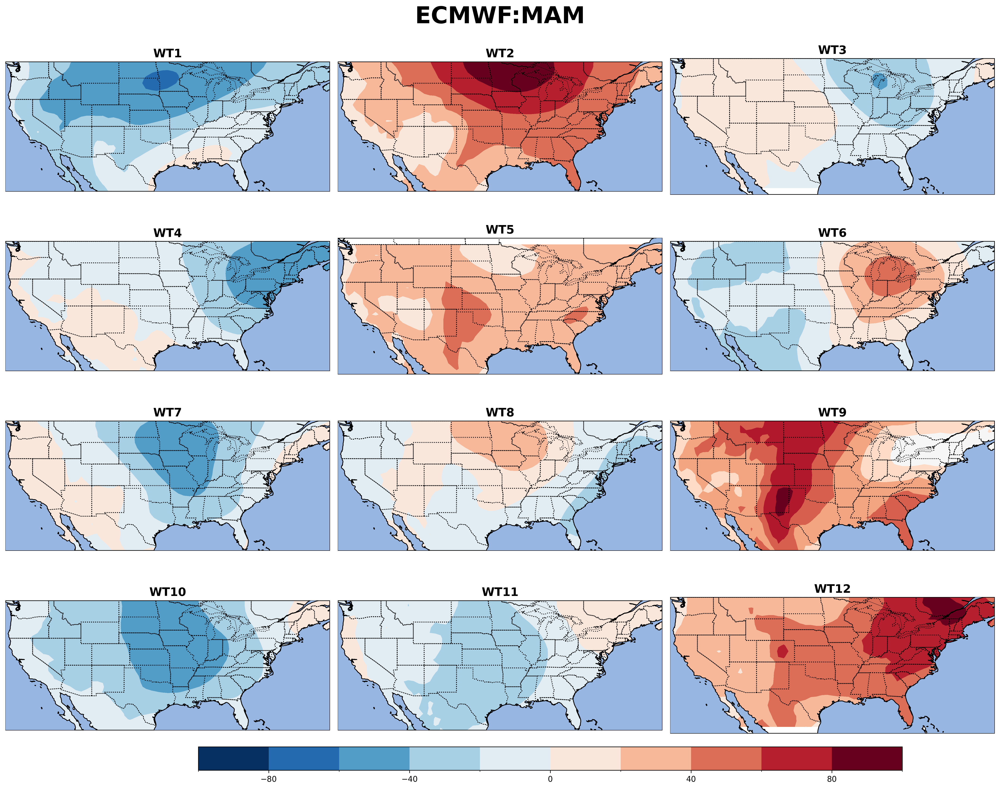

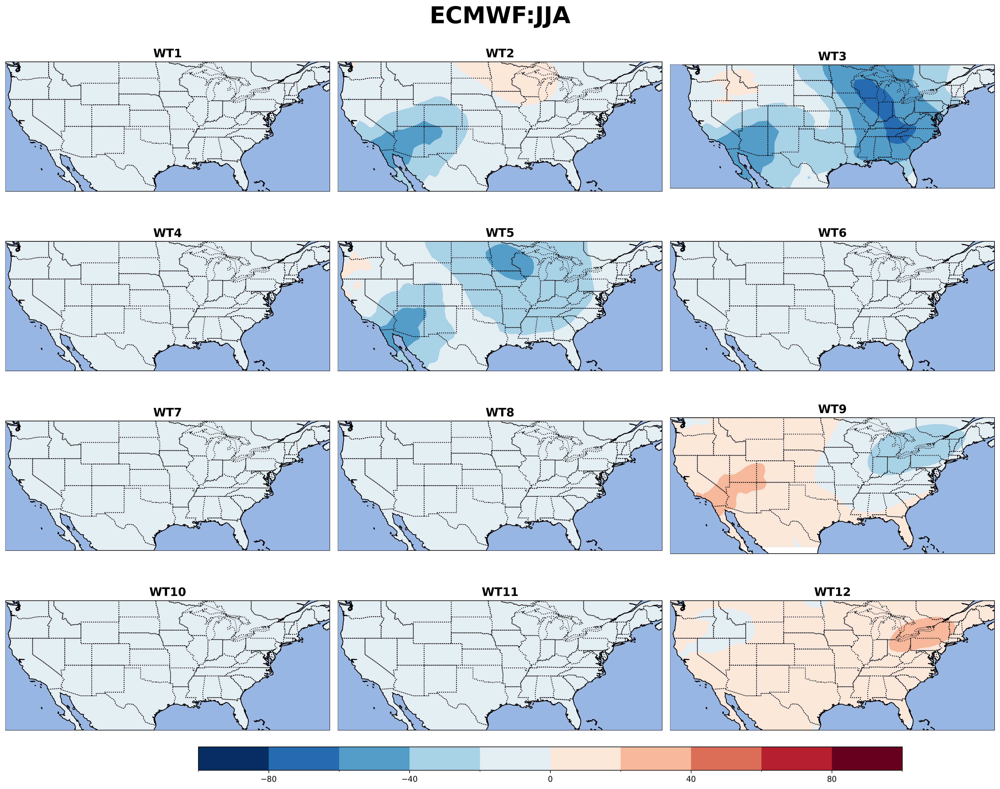

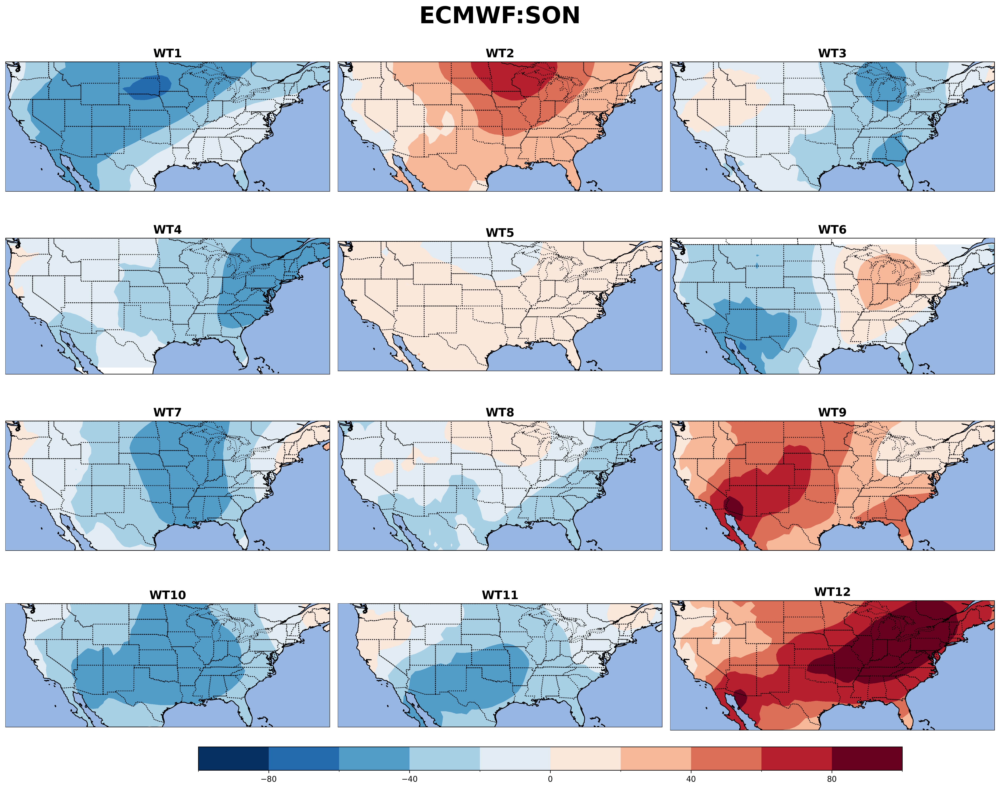

In [12]:
for mem in range(1,26):
    mem_s = str(mem).zfill(2) 
    flnm = dir_wt + var_s.upper() + '/' + var_s + '_seasonal_ano_mem' + mem_s + '.nc'
    mem_s = str(mem).zfill(2) 
    with  xr.open_dataset(flnm) as ds:
        # proj = ccrs.PlateCarree(central_longitude=180)
        # longitude from [-180, 180] -> [0,360]
        #ds.coords['longitude'] = xr.where(ds['longitude'] < 0, ds['longitude'] + 360, ds['longitude'])
        #ds = ds.sortby(ds.longitude)
        if mem == 1: 
            z500_wt = ds.__xarray_dataarray_variable__.sel(lat=slice(lat_e, lat_s), lon=slice(lon_s, lon_e))
        else:
            z500_wt = z500_wt + ds.__xarray_dataarray_variable__

season_s = ['DJF','MAM','JJA','SON']            
 
# Because proj = ccrs.PlateCarree(central_longitude=180)
# I need to convert longitude from [-180, 180] -> [0,360]
#z500_wt.coords['longitude'] = xr.where(z500_wt['longitude'] < 0, z500_wt['longitude'] + 360, z500_wt['longitude'])
#z500_wt = z500_wt.sortby(z500_wt.longitude)
 
z500_wt = z500_wt/25
 
for ns in range(4):  
    plot_prec_12_erai(z500_wt[:,ns]*100, -100, 100, 11, 'RdBu_r', 'horizontal', 'ECMWF:' + season_s[ns]);
     